In [ ]:
#Harris corner detection 
import numpy as np
import matplotlib.pyplot as plt
from PIL.Image import *
from scipy import ndimage

def imap1(im):
    print('testing the picture . . .')
    a = Image.getpixel(im, (0, 0))
    if type(a) == int:
        return im
    else:
        c, l = im.size
        imarr = np.asarray(im)
        neim = np.zeros((l, c))
        for i in range(l):
            for j in range(c):
                t = imarr[i, j]
                ts = sum(t)/len(t)
                neim[i, j] = ts
        return neim

def Harris(im):
    neim = imap1(im)
    imarr = np.asarray(neim, dtype=np.float64)
    ix = ndimage.sobel(imarr, 0)
    iy = ndimage.sobel(imarr, 1)
    ix2 = ix * ix
    iy2 = iy * iy
    ixy = ix * iy
    ix2 = ndimage.gaussian_filter(ix2, sigma=2)
    iy2 = ndimage.gaussian_filter(iy2, sigma=2)
    ixy = ndimage.gaussian_filter(ixy, sigma=2)
    c, l = imarr.shape
    result = np.zeros((c, l))
    r = np.zeros((c, l))
    rmax = 0
    for i in range(c):
        print('loking for corner . . .')
        for j in range(l):
            print('test ',j)
            m = np.array([[ix2[i, j], ixy[i, j]], [ixy[i, j], iy2[i, j]]], dtype=np.float64)
            r[i, j] = np.linalg.det(m) - 0.04 * (np.power(np.trace(m), 2))
            if r[i, j] > rmax:
                rmax = r[i, j]
    for i in range(c - 1):
        print(". .")
        for j in range(l - 1):
            print('loking')
            if r[i, j] > 0.01 * rmax and r[i, j] > r[i-1, j-1] and r[i, j] > r[i-1, j+1]\
                                     and r[i, j] > r[i+1, j-1] and r[i, j] > r[i+1, j+1]:
                result[i, j] = 1

    pc, pr = np.where(result == 1)
    plt.plot(pr, pc, 'r+')
    plt.savefig('harris_test.png')
    plt.imshow(im, 'gray')
    plt.show()
    # plt.imsave('harris_test.png', im, 'gray')

im = open('/home/ankit/Desktop/ph.jpg')
Harris(im)

testing the picture . . .
loking for corner . . .
test  0
test  1
test  2
test  3
test  4
test  5
test  6
test  7
test  8
test  9
test  10
test  11
test  12
test  13
test  14
test  15
test  16
test  17
test  18
test  19
test  20
test  21
test  22
test  23
test  24
test  25
test  26
test  27
test  28
test  29
test  30
test  31
test  32
test  33
test  34
test  35
test  36
test  37
test  38
test  39
test  40
test  41
test  42
test  43
test  44
test  45
test  46
test  47
test  48
test  49
test  50
test  51
test  52
test  53
test  54
test  55
test  56
test  57
test  58
test  59
test  60
test  61
test  62
test  63
test  64
test  65
test  66
test  67
test  68
test  69
test  70
test  71
test  72
test  73
test  74
test  75
test  76
test  77
test  78
test  79
test  80
test  81
test  82
test  83
test  84
test  85
test  86
test  87
test  88
test  89
test  90
test  91
test  92
test  93
test  94
test  95
test  96
test  97
test  98
test  99
test  100
test  101
test  102
test  103
test  104
test  105


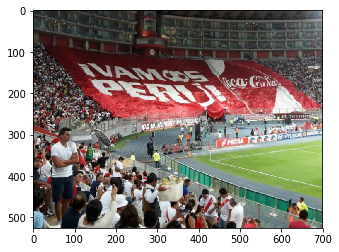

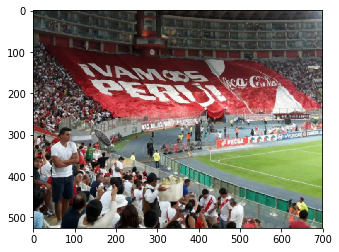

In [21]:
#Median filter
from PIL import Image
import matplotlib.pyplot as plt
path = "/home/ankit/Desktop/sobel.jpeg" # Your image path 
img = Image.open(path)
plt.imshow(img)
plt.show()
width,height=img.size
members = [(0,0)] * 9
newimg = Image.new("RGB",(width,height),"white")
for i in range(1,width-1):
    for j in range(1,height-1):
        members[0] = img.getpixel((i-1,j-1))
        members[1] = img.getpixel((i-1,j))
        members[2] = img.getpixel((i-1,j+1))
        members[3] = img.getpixel((i,j-1))
        members[4] = img.getpixel((i,j))
        members[5] = img.getpixel((i,j+1))
        members[6] = img.getpixel((i+1,j-1))
        members[7] = img.getpixel((i+1,j))
        members[8] = img.getpixel((i+1,j+1))
        members.sort()
        newimg.putpixel((i,j),(members[4]))
        
plt.imshow(newimg)
plt.show()

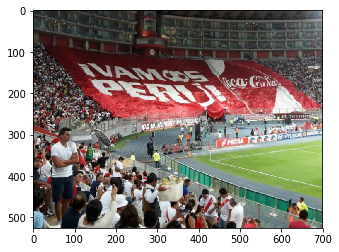

700
526


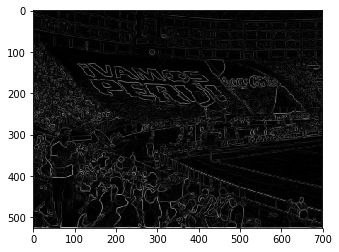

In [77]:
from PIL import Image
import matplotlib.pyplot as plt
path = "/home/ankit/Desktop/sobel.jpeg" # Your image path 
img = Image.open(path)
plt.imshow(img)
plt.show()
width,height=img.size
members = [(0,0)] * 9
newimg = Image.new("RGB",(width,height),"white")
for i in range(1,width-1):
    for j in range(1,height-1):
        members[0] = img.getpixel((i-1,j-1))
        members[1] = img.getpixel((i-1,j))
        members[2] = img.getpixel((i-1,j+1))
        members[3] = img.getpixel((i,j-1))
        members[4] = img.getpixel((i,j))
        members[5] = img.getpixel((i,j+1))
        members[6] = img.getpixel((i+1,j-1))
        members[7] = img.getpixel((i+1,j))
        members[8] = img.getpixel((i+1,j+1))
        members.sort()
        newimg.putpixel((i,j),(members[4]))
from PIL import Image
import math
#path = "/home/ankit/Desktop/sobel.jpeg" # Your image path 
img = newimg#Image.open(path)
width,height=img.size
newimg = Image.new("RGB", (width, height), "white")
print(width)
print(height)
for x in range(1, width-1):  # ignore the edge pixels for simplicity (1 to width-1)
    for y in range(1, height-1): # ignore edge pixels for simplicity (1 to height-1)

        # initialise Gx to 0 and Gy to 0 for every pixel
        Gx = 0
        Gy = 0

        # top left pixel
        p = img.getpixel((x-1, y-1))
        r = p[0]
        g = p[1]
        b = p[2]

        # intensity ranges from 0 to 765 (255 * 3)
        intensity = r + g + b

        # accumulate the value into Gx, and Gy
        Gx += -intensity
        Gy += -intensity

        # remaining left column
        p = img.getpixel((x-1, y))
        r = p[0]
        g = p[1]
        b = p[2]

        Gx += -2 * (r + g + b)

        p = img.getpixel((x-1, y+1))
        r = p[0]
        g = p[1]
        b = p[2]

        Gx += -(r + g + b)
        Gy += (r + g + b)

        # middle pixels
        p = img.getpixel((x, y-1))
        r = p[0]
        g = p[1]
        b = p[2]

        Gy += -2 * (r + g + b)

        p = img.getpixel((x, y+1))
        r = p[0]
        g = p[1]
        b = p[2]

        Gy += 2 * (r + g + b)

        # right column
        p = img.getpixel((x+1, y-1))
        r = p[0]
        g = p[1]
        b = p[2]

        Gx += (r + g + b)
        Gy += -(r + g + b)

        p = img.getpixel((x+1, y))
        r = p[0]
        g = p[1]
        b = p[2]

        Gx += 2 * (r + g + b)

        p = img.getpixel((x+1, y+1))
        r = p[0]
        g = p[1]
        b = p[2]

        Gx += (r + g + b)
        Gy += (r + g + b)

        # calculate the length of the gradient (Pythagorean theorem)
        length = math.sqrt((Gx * Gx) + (Gy * Gy))

        # normalise the length of gradient to the range 0 to 255
        length = length / 4000 * 255

        length = int(length)

        # draw the length in the edge image
        #newpixel = img.putpixel((length,length,length))
        newimg.putpixel((x,y),(length,length,length))
plt.imshow(newimg)
plt.show()


In [94]:
def sobel_edge(img):

#path = "/home/ankit/Desktop/sobel.jpeg" # Your image path 
#img = Image.open(path)
 width,height=img.size
 max=0
 newimg = Image.new("RGB", (width, height), "white")
 for x in range(1, width-1):  # ignore the edge pixels for simplicity (1 to width-1)
    for y in range(1, height-1): # ignore edge pixels for simplicity (1 to height-1)

        # initialise Gx to 0 and Gy to 0 for every pixel
        Gx = 0
        Gy = 0

        # top left pixel
        p = img.getpixel((x-1, y-1))
        r = p[0]
        g = p[1]
        b = p[2]

        # intensity ranges from 0 to 765 (255 * 3)
        intensity = r + g + b

        # accumulate the value into Gx, and Gy
        Gx += -intensity
        Gy += -intensity

        # remaining left column
        p = img.getpixel((x-1, y))
        r = p[0]
        g = p[1]
        b = p[2]

        Gx += -2 * (r + g + b)

        p = img.getpixel((x-1, y+1))
        r = p[0]
        g = p[1]
        b = p[2]

        Gx += -(r + g + b)
        Gy += (r + g + b)

        # middle pixels
        p = img.getpixel((x, y-1))
        r = p[0]
        g = p[1]
        b = p[2]

        Gy += -2 * (r + g + b)

        p = img.getpixel((x, y+1))
        r = p[0]
        g = p[1]
        b = p[2]

        Gy += 2 * (r + g + b)

        # right column
        p = img.getpixel((x+1, y-1))
        r = p[0]
        g = p[1]
        b = p[2]

        Gx += (r + g + b)
        Gy += -(r + g + b)

        p = img.getpixel((x+1, y))
        r = p[0]
        g = p[1]
        b = p[2]

        Gx += 2 * (r + g + b)

        p = img.getpixel((x+1, y+1))
        r = p[0]
        g = p[1]
        b = p[2]

        Gx += (r + g + b)
        Gy += (r + g + b)

        # calculate the length of the gradient (Pythagorean theorem)
        length = math.sqrt((Gx * Gx) + (Gy * Gy))
         
        if max<length:
            max=length

        # normalise the length of gradient to the range 0 to 255
        length = length / 1000 * 255
        length = int(length)
       

        # draw the length in the edge image
        #newpixel = img.putpixel((length,length,length))
        newimg.putpixel((x,y),(length,length,length))
 #plt.imshow(newimg)
 #plt.show()
 print(max)
 return (newimg)
 


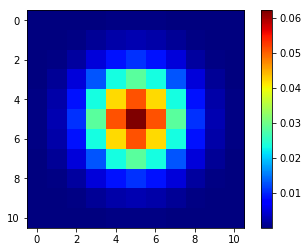

In [19]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
def gaussian_filter(sigma):
    size = 2*np.ceil(3*sigma)+1
    x, y = np.mgrid[-size//2 + 1:size//2 + 1, -size//2 + 1:size//2 + 1]
    g = np.exp(-((x**2 + y**2)/(2.0*sigma**2))) / (2*np.pi*sigma**2)
    return g/g.sum()
gaussian_kernel_array=gaussian_filter(1.6)
h,w = gaussian_kernel_array.shape
#for i in range(0,h):
 #     print(gaussian_kernel_array[i,:])

h,w = gaussian_kernel_array.shape
#for i in range(0,h):
#      print(gaussian_kernel_array[i,:])
plt.imshow(gaussian_kernel_array, cmap=plt.get_cmap('jet'), interpolation='nearest')
plt.colorbar()
plt.show()

In [4]:
def gaussian_blur_convolution(image, kernel, average=False):
   # image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    image_row, image_col = image.shape
    kernel_row, kernel_col = kernel.shape
 
    output = np.zeros(image.shape)
 
    pad_height = int((kernel_row - 1) / 2)
    pad_width = int((kernel_col - 1) / 2)
 
    padded_image = np.zeros((image_row + (2 * pad_height), image_col + (2 * pad_width)))
 
    padded_image[pad_height:padded_image.shape[0] - pad_height, pad_width:padded_image.shape[1] - pad_width] = image
 
    for row in range(image_row):
        for col in range(image_col):
            output[row, col] = np.sum(kernel * padded_image[row:row + kernel_row, col:col + kernel_col])
            output[row, col] /= kernel.shape[0] * kernel.shape[1]
    return output


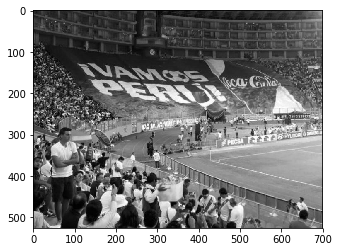

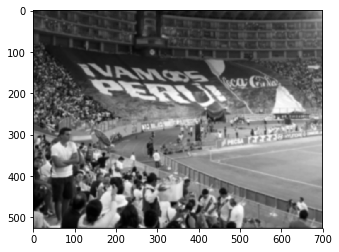

In [109]:
import cv2
import numpy as np
import numpy
import matplotlib.pyplot as plt
from PIL import Image
import math
%matplotlib inline
img = cv2.imread('/home/ankit/Desktop/sobel.jpeg')
img = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
plt.imshow(img,cmap='gray')
plt.show()
filtered_image = gaussian_blur_convolution(img,gaussian_kernel_array)
plt.imshow(filtered_image,cmap='gray')
plt.show()
#rint(filtered_image.shape)
#filtered_image = Image.fromarray(filtered_image, 'L')
#filtered_image.show()
#edged_image = sobel_edge(filtered_image)
#plt.imshow(edged_image,cmap='gray')
#plt.show()
